##Giới thiệu
Họ và tên: Nguyễn Lê Duy Minh - MSSV: 20DH112081

Đề tài: Phân loại hình ảnh rác sử dụng 3 mạng nơ-ron của Keras gồm ResNet50, DenseNet121, MobileNet và chọn ra 1 trong 3 để tìm hiểu  
Bài toán: Phân loại


#1 Chuẩn bị dữ liệu
[Trash dataset](https://www.kaggle.com/datasets/surabhisathish/finaldata)
Tập dữ liệu bao gồm 7975 mẫu huấn luyện và 1050 mẫu kiểm tra.

Tập dữ liệu có 10 lớp tương ứng với 10 loại rác:
- Battery
- Biological
- Brown-glass
- Cardboard
- Green-glass
- Metal
- Paper
- Plastic
- Trash
- White-glass


##1.1 Tải tập dữ liệu

In [ ]:
%%shell
pip -q install --upgrade --no-cache-dir gdown
gdown -q 1l4z4arte9jCCQYCYugrCeTIFL5nmq_k6
echo 'download: done => file: Trash_image.zip'
rm -rf /Trash-Image/
unzip -q Trash_image.zip



download: done => file: Trash_image.zip


##1.2 Gọi các thư viện

In [ ]:
# Basic
import os
import glob
import numpy as np
import pandas as pd

# Data Viz
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt

# Tensorflow for machine learning
import tensorflow as tf
import tensorflow.keras.utils as utils
import tensorflow.keras.applications as app
import tensorflow.keras.layers as layers
import tensorflow.keras as keras
from tensorflow.keras.applications.imagenet_utils import decode_predictions
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, GlobalAvgPool2D as GAP, Dropout
from keras.models import load_model

# Callbacks
from keras.callbacks import ModelCheckpoint, EarlyStopping


# Classification models
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB1
from tensorflow.keras.applications import VGG16, ResNet50, ResNet50V2, InceptionV3, Xception, \
        ResNet152, ResNet152V2, MobileNetV3Large,MobileNetV3Small,NASNetLarge,InceptionResNetV2

from heapq import nlargest

##1.3 Tìm hiểu tập dữ liệu

In [ ]:
path_to_train = '/content/rubbish-data/train' #tập này dùng để huấn luyện và đánh giá mô hình
path_to_val = '/content/rubbish-data/val' #tập này dùng để kiểm tra mô hình
path_to_test='/content/rubbish-data/test'#tập này dùng để show mô hình

####1.3.1 Lấy ra danh sách tên đặt trưng

In [ ]:
class_names = list(filter(lambda f: os.path.isdir(os.path.join(path_to_train, f)), os.listdir(path_to_train)))
class_names = sorted(class_names)
num_classes = len(class_names)
print(f"Class Names: \n{class_names}")
print(f"Total Number of Classes : {num_classes}")

Class Names: 
['battery', 'biological', 'brown-glass', 'cardboard', 'green-glass', 'metal', 'paper', 'plastic', 'trash', 'white-glass']
Total Number of Classes : 10


#### 1.3.2 Tập train

In [ ]:
class_dis = [len(os.listdir(path_to_train + f"/{name}")) for name in class_names]
lk_dis = dict(zip(class_names, class_dis))
print(f"Class Distribution : \n{lk_dis}")

fig = px.pie(names=class_names, values=class_dis, width=600)
fig.update_layout({"title":{'text':"Class Distribution","x":0.5}})
fig.show()

Class Distribution : 
{'battery': 756, 'biological': 752, 'brown-glass': 923, 'cardboard': 1016, 'green-glass': 532, 'metal': 943, 'paper': 839, 'plastic': 927, 'trash': 667, 'white-glass': 620}


. Tập dữ liệu không đồng đều với nhỏ nhất 6.67% là green-glass có 532 giá trị và lớn nhất 12.7% là cardboard với 1016 giá trị

Found 7975 files belonging to 10 classes.


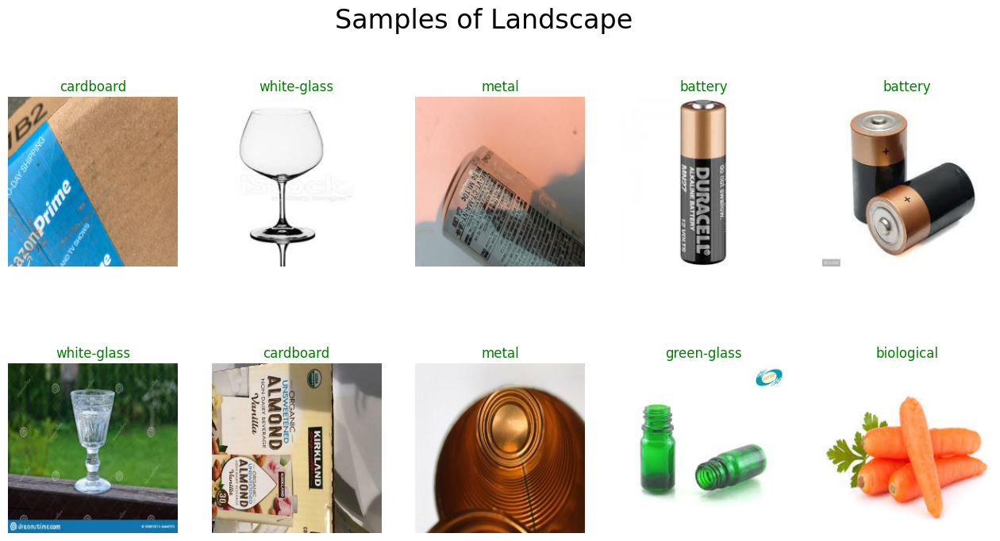

In [ ]:
dataset = tf.keras.utils.image_dataset_from_directory(
  path_to_train,
  image_size=(224, 224),
  batch_size=16,
  shuffle=True)
def show_images(dataset):
  plt.figure(figsize=(16,8))
  plt.suptitle('Samples of Landscape', fontsize=24)
  for images, labels in dataset.take(1):
    for i in range(10):
      ax = plt.subplot(2, 5, i + 1)
      ax.imshow(images[i].numpy().astype("uint8"))
      ax.set_title(dataset.class_names[labels[i]], color = 'g')
      ax.axis("off")
  plt.show()

show_images(dataset)

#### 1.3.3 Tập validate

In [ ]:
class_dis = [len(os.listdir(path_to_val + f"/{name}")) for name in class_names]
lk_dis = dict(zip(class_names, class_dis))
print(f"Class Distribution : \n{lk_dis}")

fig = px.pie(names=class_names, values=class_dis, width=600)
fig.update_layout({"title":{'text':"Class Distribution","x":0.5}})
fig.show()

Class Distribution : 
{'battery': 94, 'biological': 116, 'brown-glass': 107, 'cardboard': 127, 'green-glass': 116, 'metal': 117, 'paper': 104, 'plastic': 109, 'trash': 83, 'white-glass': 77}


. Tập dữ liệu validate  cũng không đều với 7.33% tại white-glass chỉ có 77 giá trị nhưng 12.1% tại cardboard với tận 127 giá trị

Found 1050 files belonging to 10 classes.


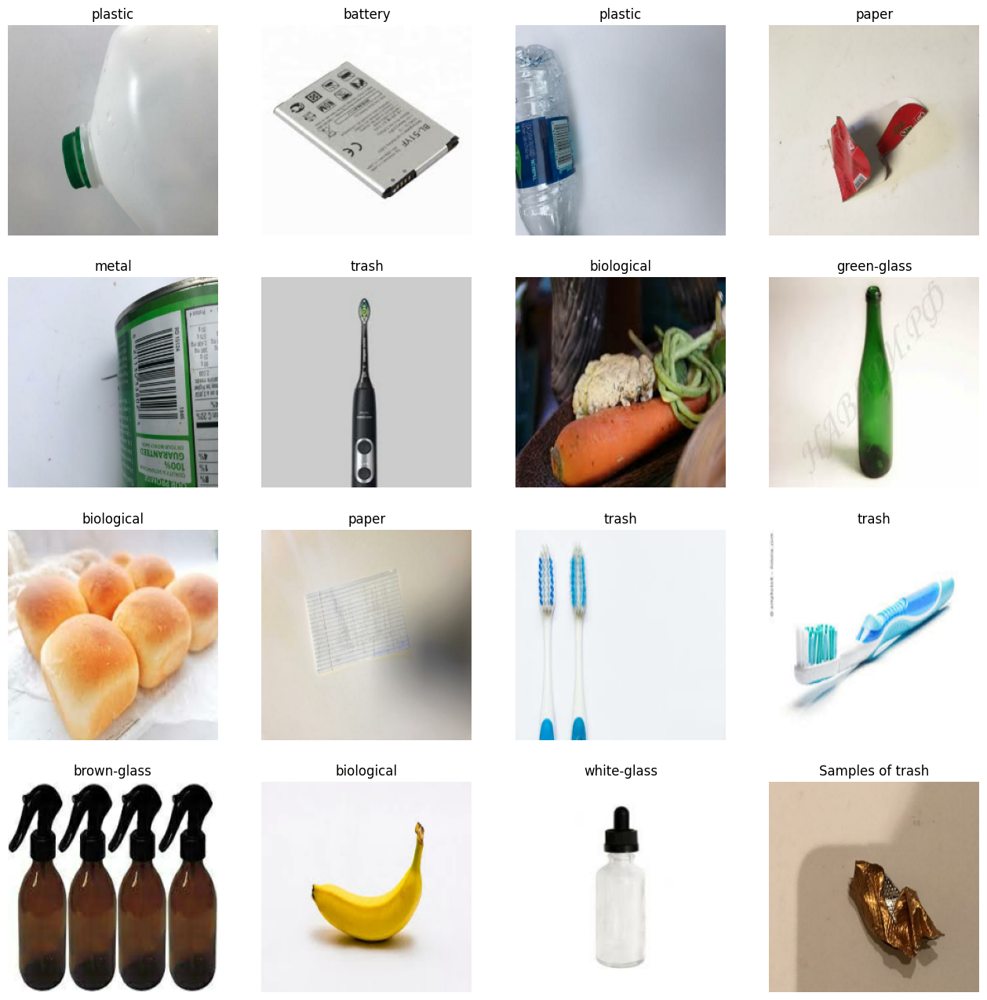

In [ ]:
dataset = tf.keras.utils.image_dataset_from_directory(
  path_to_val,
  image_size=(224, 224),
  batch_size=16,
  shuffle=True)

def show_images(dataset):
  plt.figure(figsize=(16,16))
  for images, labels in dataset.take(1):
    for i in range(16):
      ax = plt.subplot(4, 4, i + 1)
      ax.imshow(images[i].numpy().astype("uint8"))
      ax.set_title(dataset.class_names[labels[i]])
      ax.axis("off")
  plt.title("Samples of trash")
  plt.show()

show_images(dataset)

#2 Định nghĩa mô hình

In [ ]:
feature_extractor = {
    "ResNet50": ResNet50(include_top=False, input_shape=(224, 224, 3), weights='imagenet'),
    "DenseNet121": ResNet50(include_top=False, input_shape=(224, 224, 3), weights="imagenet"),
    "MobileNet": InceptionV3(include_top=False, input_shape=(224, 224, 3), weights="imagenet")


}
preprocess_methods = {
    "ResNet50": app.resnet50.preprocess_input,
    "DenseNet121": app.densenet.preprocess_input,
    "MobileNet": app.mobilenet.preprocess_input
}
input_sizes = {
    "ResNet50": (224, 224),
    "DenseNet121": (224, 224),
    "MobileNet": (299, 299)
}

batch_size = 32

87910968/87910968 [==============================] - 3s 0us/step


##2.1 Gọi backbone

In [ ]:
backbones = ["ResNet50", "DenseNet121", "MobileNet"]
rs = []
trained_model = {}

##2.2 Huấn luyện và lưu lại mô hình

Found 5588 images belonging to 10 classes.
Found 311 images belonging to 10 classes.
Model: "ResNet50"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 10)                20490     
                                                                 
Total params: 23,608,202
Trainable params: 20,490
Non-trainable params: 23,587,712
_________________________________________________________________


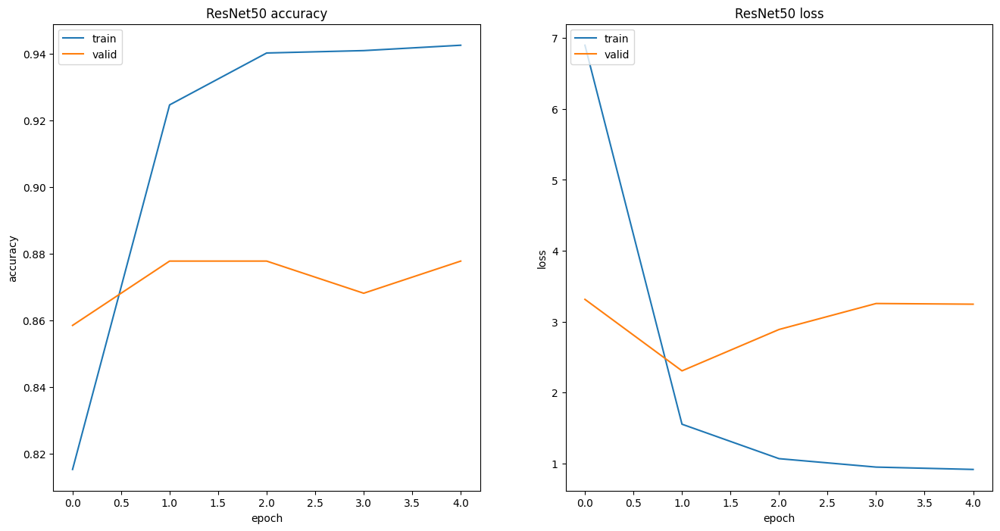

10/10 [==============================] - 7s 568ms/step - loss: 3.0631 - accuracy: 0.8778
                                                                                                    
Found 5588 images belonging to 10 classes.
Found 311 images belonging to 10 classes.
Model: "DenseNet121"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 global_average_pooling2d_1   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_1 (Dense)             (None, 10)                20490     
                                                                 
Total params: 23,608,202
Trainable params: 20,490
Non-trainable params: 23,587,712
___________________________

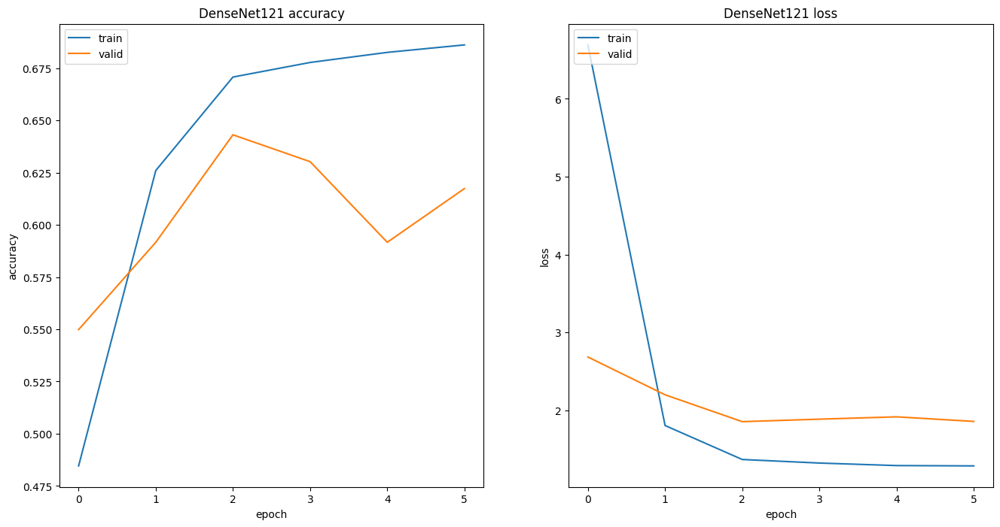

10/10 [==============================] - 5s 399ms/step - loss: 2.0919 - accuracy: 0.5852
                                                                                                    
Found 5588 images belonging to 10 classes.
Found 311 images belonging to 10 classes.
Model: "MobileNet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 global_average_pooling2d_2   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dense_2 (Dense)             (None, 10)                20490     
                                                                 
Total params: 21,823,274
Trainable params: 20,490
Non-trainable params: 21,802,784
_____________________________

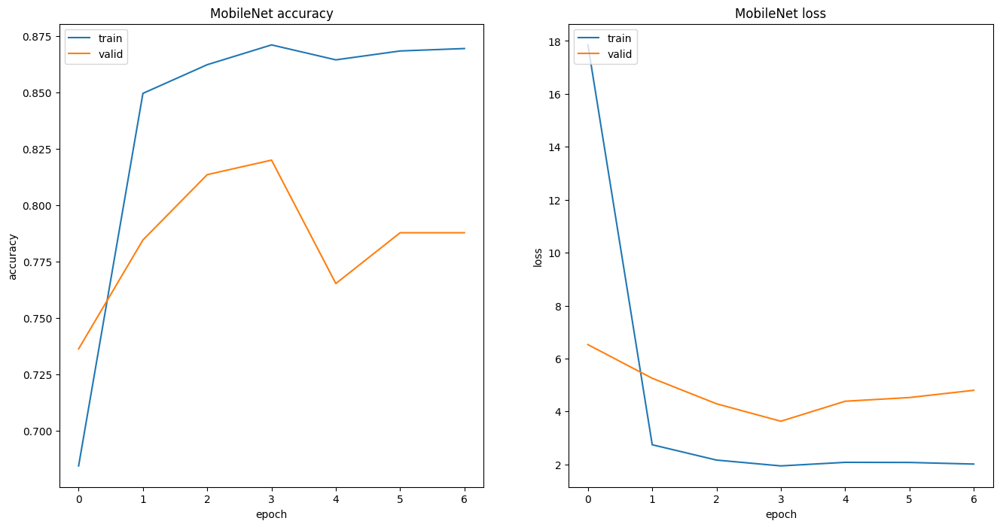

10/10 [==============================] - 6s 401ms/step - loss: 4.7154 - accuracy: 0.7910
                                                                                                    


In [ ]:
for backbone in backbones:
  generator = ImageDataGenerator(
      horizontal_flip=True,
      vertical_flip=True,
      rotation_range=20,
      validation_split=0.3,
      preprocessing_function=preprocess_methods[backbone])


  train_set = generator.flow_from_directory(
      path_to_train,
      target_size=(224, 224),
      class_mode='binary',
      batch_size= batch_size,
      shuffle=True,
      subset='training')

  valid_set = generator.flow_from_directory(
      path_to_val,
      target_size=(224, 224),
      class_mode='binary',
      batch_size= batch_size,
      shuffle=True,
      subset='validation')


  fextractor = feature_extractor[backbone]
  fextractor.trainable = False

  model = keras.Sequential([
      fextractor,
      GAP(),
      Dense(num_classes, activation='softmax')
  ], name=backbone)
  model.summary()



  initial_learning_rate = 0.1
  lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
      initial_learning_rate,
      decay_steps=5,
      decay_rate=0.95,
      staircase=True)
  optimizer = tf.keras.optimizers.Adam(
      learning_rate=lr_schedule)

  model.compile(
      loss='sparse_categorical_crossentropy',
      optimizer=optimizer,
      metrics=['accuracy']
  )

  cbs = [
      EarlyStopping(patience=3, restore_best_weights=True),
      ModelCheckpoint(backbone + ".h5", save_best_only=True)
  ]

  history = model.fit(
      train_set, validation_data=valid_set,
      callbacks=cbs,
      epochs=10,
      verbose=0
  )



  fig = plt.figure(figsize=(16,8))

  ax1 = fig.add_subplot(1, 2, 1)
  ax1.plot(history.history['accuracy'])
  ax1.plot(history.history['val_accuracy'])
  ax1.set_title('{} accuracy'.format(backbone))
  ax1.set_ylabel('accuracy')
  ax1.set_xlabel('epoch')
  ax1.legend(['train', 'valid'], loc='upper left')

  ax2 = fig.add_subplot(1, 2, 2)
  ax2.plot(history.history['loss'])
  ax2.plot(history.history['val_loss'])
  ax2.set_title('{} loss'.format(backbone))
  ax2.set_ylabel('loss')
  ax2.set_xlabel('epoch')
  ax2.legend(['train', 'valid'], loc='upper left')
  plt.show()

  model_file = "./{:s}.h5".format(backbone)
  trained_model[backbone] = load_model(model_file)
  score = trained_model[backbone].evaluate(valid_set)
  rs_item = {"Model": backbone, "Accuracy": score[1]}
  rs.append(rs_item)


  space = ' ' * 100
  print(space)

##2.3 Dự đoán ảnh

In [ ]:
def show_prediction(dataset, model, backbone):
  for images, labels in dataset:
    print(images.dtype, images.min(), images.max())
    preprocess = preprocess_methods[backbone]
    batch = preprocess(images.copy())
    probs = model.predict(batch, verbose = 0 )

    pred_labels = probs.argmax(axis=-1)
    pred_labels = [class_names[idx] for idx in pred_labels]
    ori_labels = [class_names[int(idx)] for idx in labels]

    fig = plt.figure(figsize=(16,8), layout='constrained')
    for i in range(10):
      ax = plt.subplot(2, 5, i + 1)
      ax.imshow(images[i].astype(np.uint8))

      # Set the color of the predicted label based on correctness
      if pred_labels[i] == ori_labels[i]:
        color = 'green'
      else:
        color = 'red'

      title = "Pred: {:s} (True: {:s})".format(pred_labels[i], ori_labels[i])
      ax.set_title(title, color=color)  # Set the color of the title
      ax.axis("off")
    fig.suptitle("Dự đoán các hình trong 1 bó")
    plt.show()
    break


In [ ]:
test_generator = ImageDataGenerator()
test_set = test_generator.flow_from_directory(
    path_to_test,
    target_size=(224, 224),
    class_mode='binary',
    batch_size=batch_size,
    shuffle=True)

Found 1113 images belonging to 10 classes.


Mô hình dự đoán: ResNet50
float32 0.0 255.0


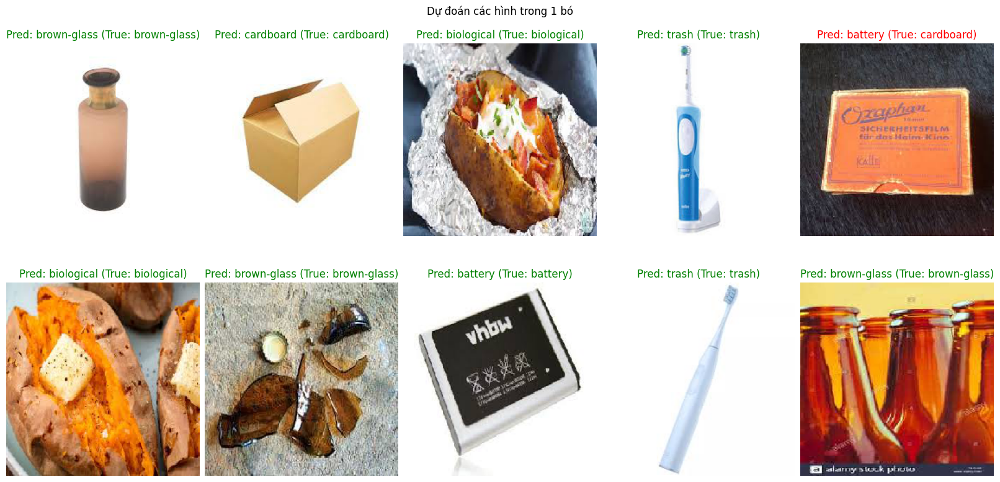

                                                                                                    
Mô hình dự đoán: DenseNet121
float32 0.0 255.0


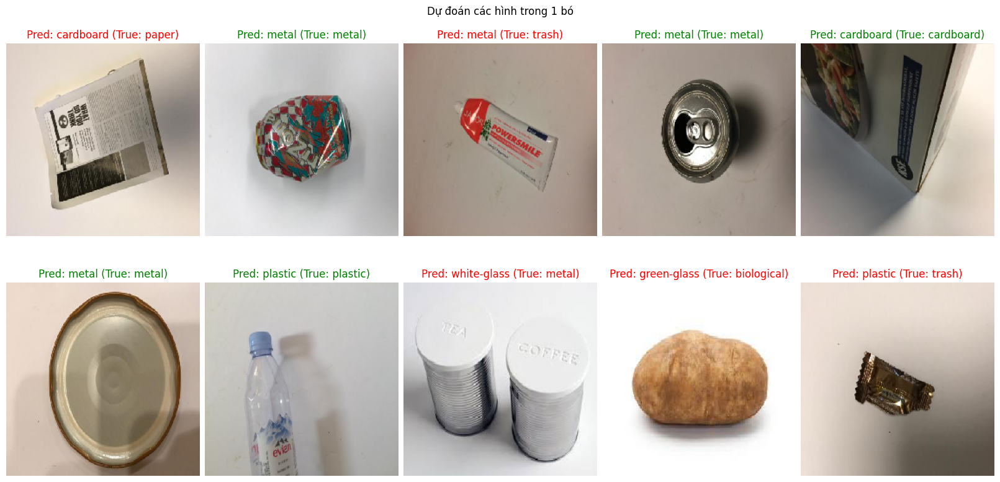

                                                                                                    
Mô hình dự đoán: MobileNet
float32 0.0 255.0


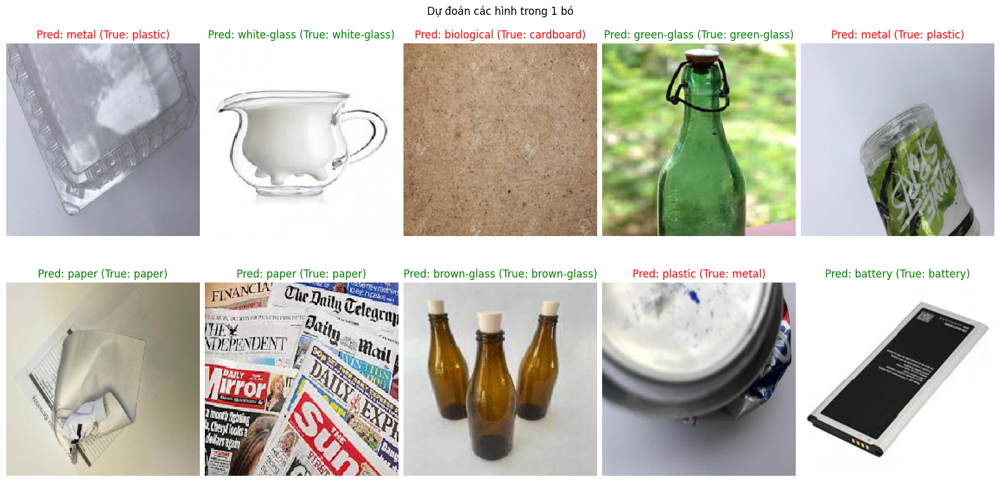

In [ ]:
for backbone in backbones:
  print('Mô hình dự đoán: {}'.format(backbone))
  show_prediction(test_set, trained_model[backbone], backbone)
  space = ' ' * 100
  print(space)

##2.4 Top kết quả hình đúng và sai

In [ ]:
def show_top_prediction(dataset, model, backbone):
  for images, labels in dataset:
    preprocess = preprocess_methods[backbone]
    batch = preprocess(images.copy())
    probs = model.predict(batch)

    pred_labels = probs.argmax(axis=-1)
    pred_labels = [class_names[idx] for idx in pred_labels]
    ori_labels = [class_names[int(idx)] for idx in labels]

    f = {}
    t = {}
    for i in range(len(pred_labels)):
      if pred_labels[i] != ori_labels[i]:
        f[i] = np.max(probs[i])

      else:
        t[i] = np.max(probs[i])

    t3 = nlargest(12, t, key = t.get)
    f3 = nlargest(12, f, key = f.get)
    sum = len(t) + len(f)


    if len(t) > 0:
      print("Số hình dự đoán đúng: {}/{}".format(len(t), sum))

      fig = plt.figure(figsize=(16, 16), layout='constrained')
      for i in range(len(t3)):
        I = int(t3[i])
        ax = plt.subplot(3, 4, i + 1)
        ax.imshow(images[I].astype(np.uint8))
        title = "Pred: {:6.2f}% {:s}(True:{:s})".format(t[I]*100 ,pred_labels[I], ori_labels[I])
        ax.set_title(title)
        ax.axis("off")
      fig.suptitle("Top ảnh dự đoán đúng")
      plt.show()

    else:
      print("Không có dự đoán đúng")


    #show top 16 false
    if len(f) > 0:
      print("Số hình dự đoán sai: {}/{}".format(len(f), sum))
      fig = plt.figure(figsize=(16, 16), layout='constrained')
      for i in range(len(f3)):
        I = int(f3[i])
        ax = plt.subplot(3, 4, i + 1)
        ax.imshow(images[I].astype(np.uint8))
        title = "Pred: {:6.2f}% {:s}(True:{:s})".format(f[I]*100 ,pred_labels[I], ori_labels[I])
        ax.set_title(title)
        ax.axis("off")
      fig.suptitle("Top ảnh dự đoán sai ")
      plt.show()
    else:
      print("Không có dự đoán sai")

    break

Mô hình dự đoán: ResNet50
1/1 [==============================] - 0s 53ms/step
Số hình dự đoán đúng: 31/32


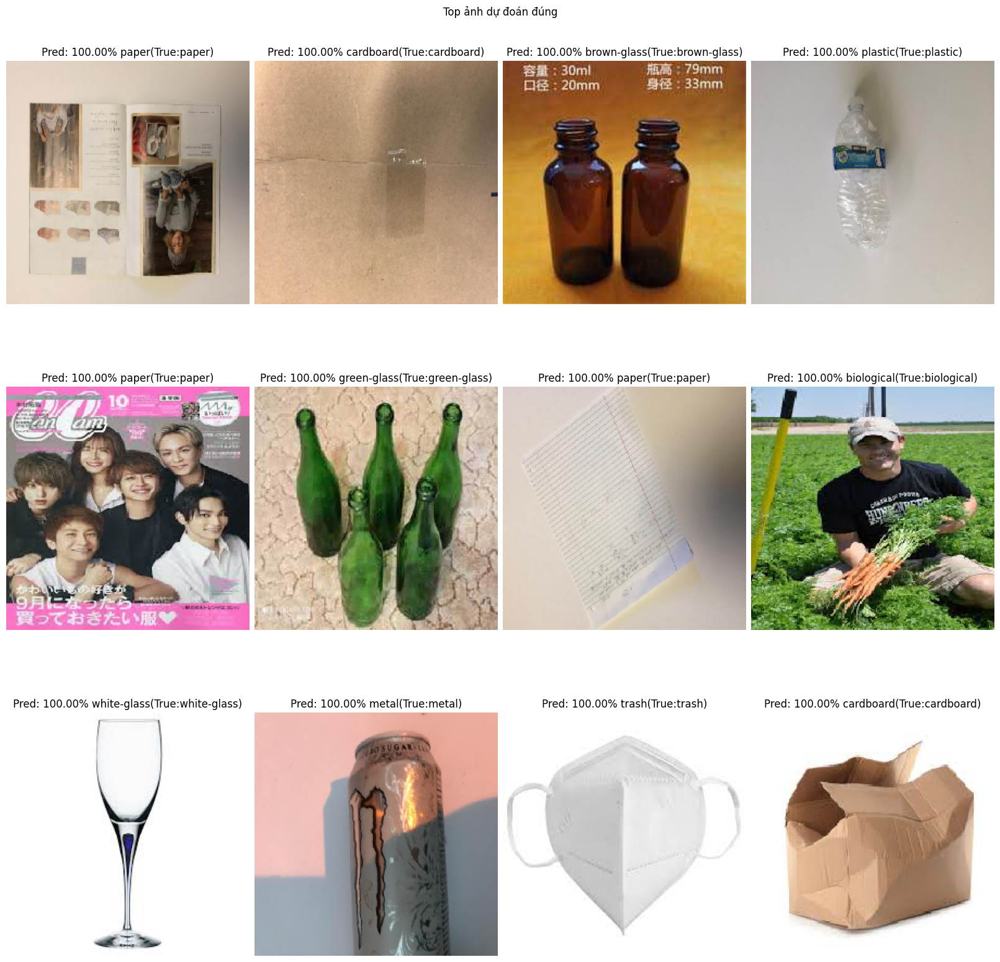

Số hình dự đoán sai: 1/32


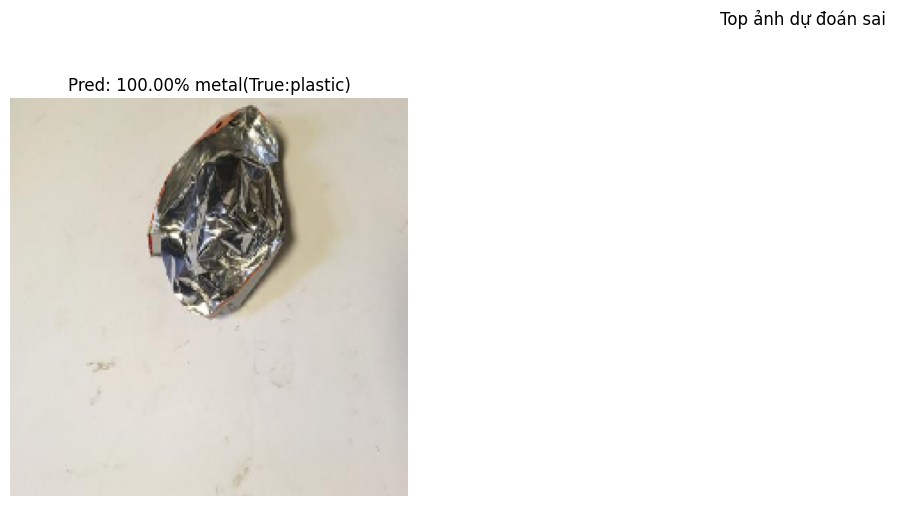

                                                                                                    
Mô hình dự đoán: DenseNet121
1/1 [==============================] - 0s 33ms/step
Số hình dự đoán đúng: 23/32


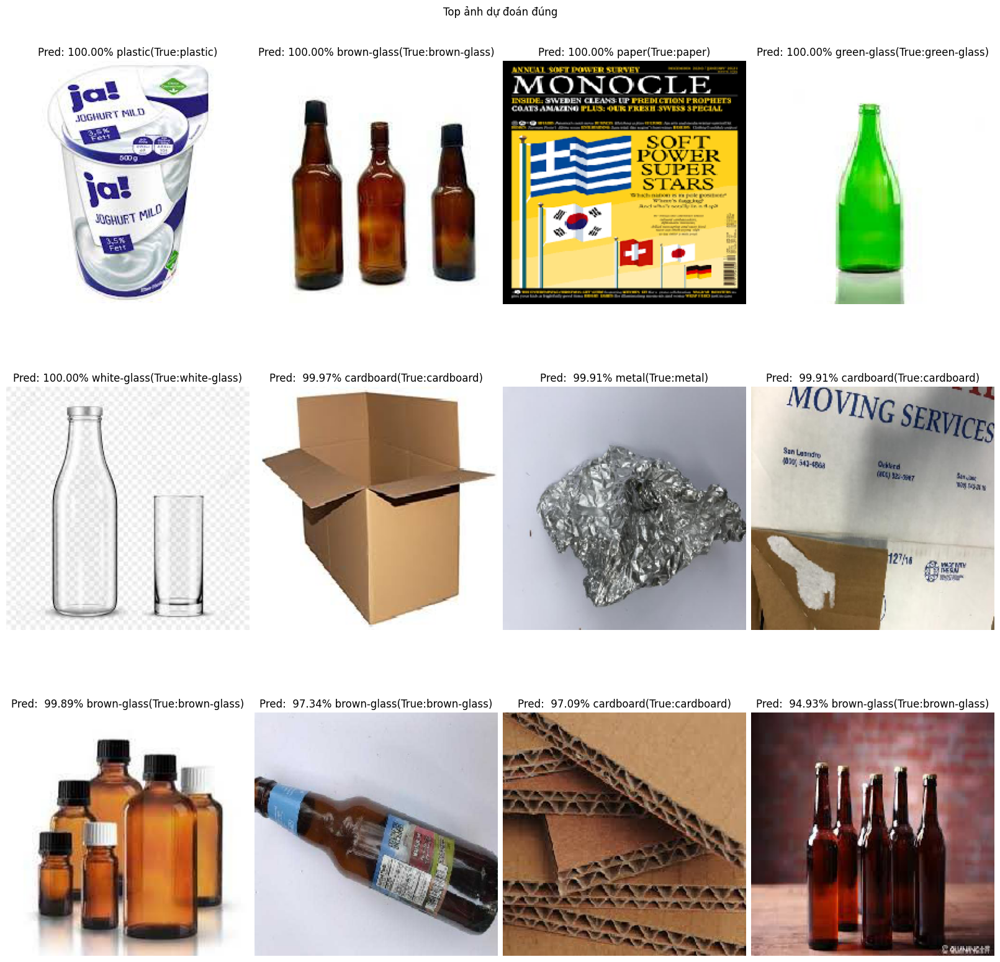

Số hình dự đoán sai: 9/32


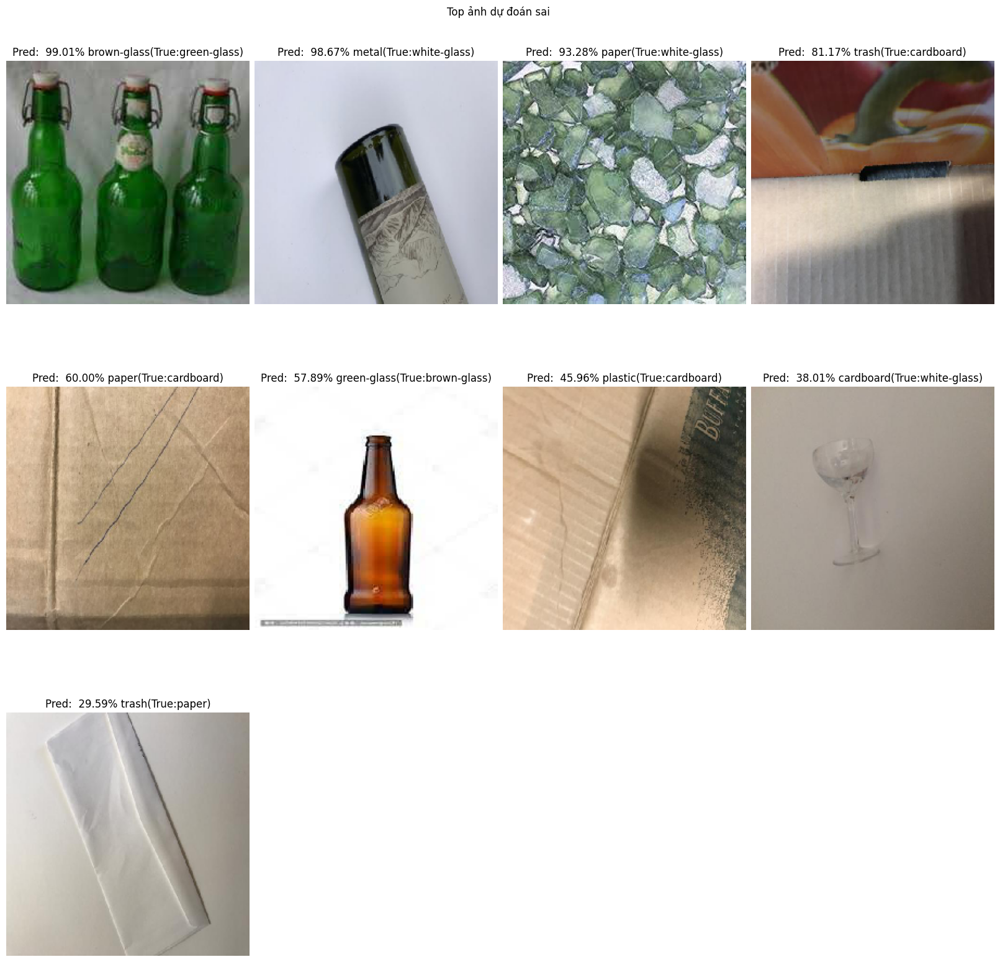

                                                                                                    
Mô hình dự đoán: MobileNet
1/1 [==============================] - 0s 52ms/step
Số hình dự đoán đúng: 27/32


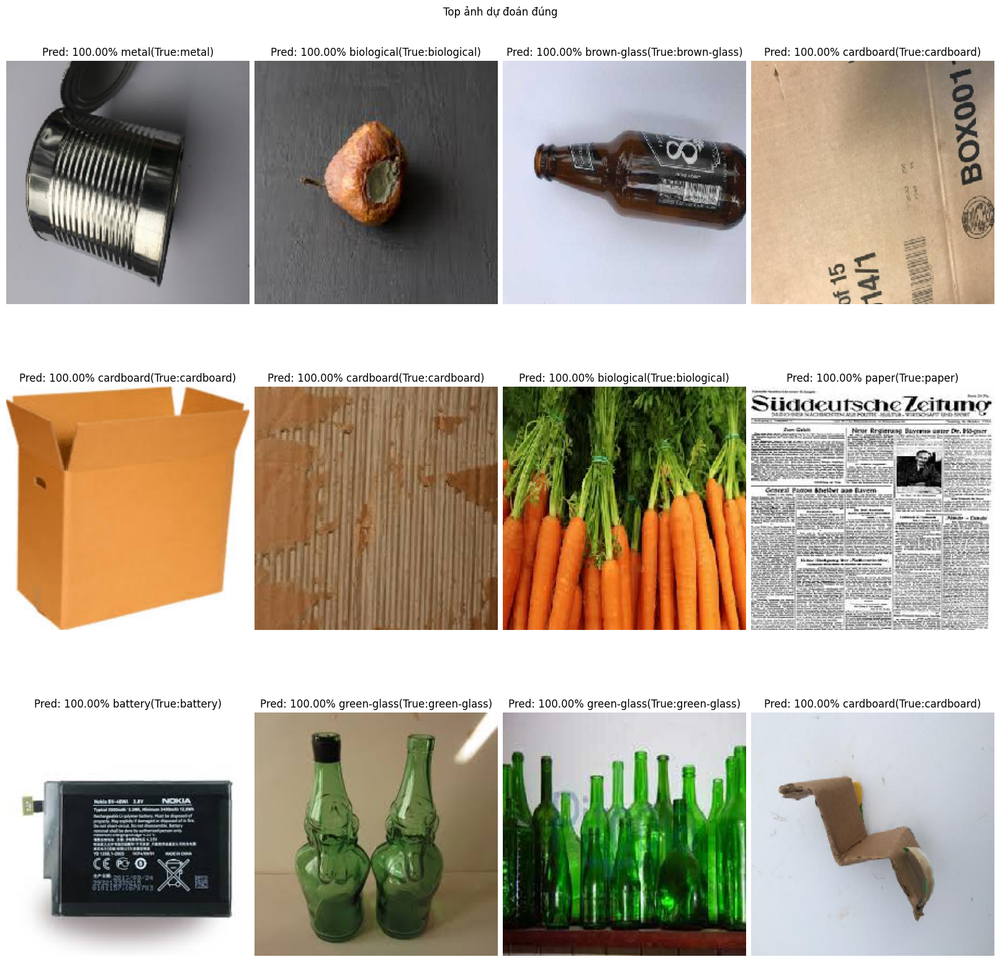

Số hình dự đoán sai: 5/32


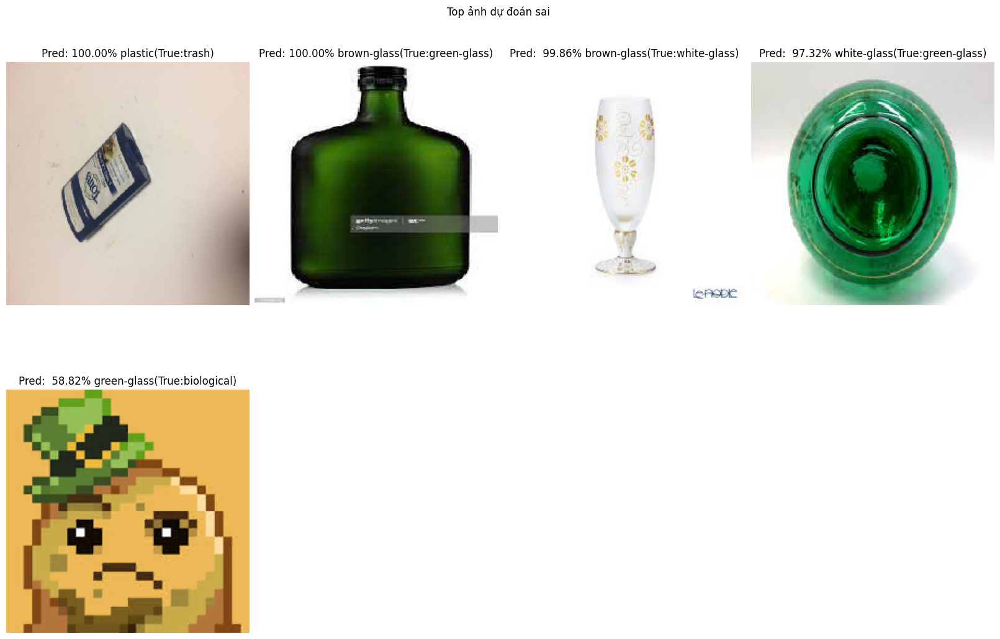

In [ ]:
for backbone in backbones:
  print('Mô hình dự đoán: {}'.format(backbone))
  show_top_prediction(test_set, trained_model[backbone], backbone)
  space = ' ' * 100
  print(space)

##2.5 Kết quả Accuracy của từng mô hình

In [ ]:
table = pd.DataFrame(rs)
table

,Model,Accuracy
0,ResNet50,0.877814
1,DenseNet121,0.585209
2,MobileNet,0.790997


In [ ]:
for images, labels in test_set:
  preprocess = preprocess_methods['DenseNet121']
  batch = preprocess(images.copy())
  y_pred = trained_model['DenseNet121'].predict(batch, verbose = 0 )
  y_test = labels
  y_pred = np.argmax(y_pred, axis = -1)
  break

In [ ]:
y_test = y_test.astype(float)

In [ ]:
y_pred.dtype

dtype('int64')

In [ ]:

from sklearn.metrics import confusion_matrix

confusion_matrix=confusion_matrix(y_test, y_pred)

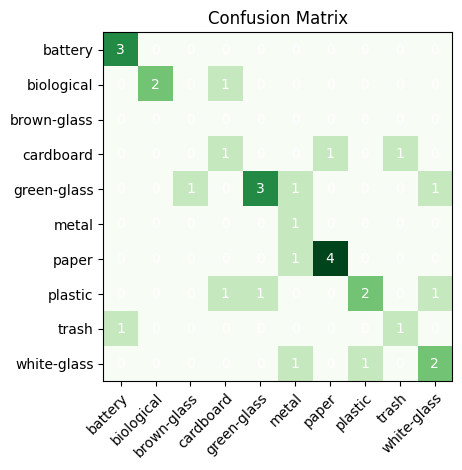

In [ ]:
fig, ax = plt.subplots()
im = ax.imshow(confusion_matrix, cmap='Greens')

# Định dạng và hiển thị các trục và nhãn
ax.set_xticks(np.arange(len(class_names)))
ax.set_yticks(np.arange(len(class_names)))
ax.set_xticklabels(class_names)
ax.set_yticklabels(class_names)
plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

# Thêm giá trị vào từng ô của ma trận nhầm lẫn
for i in range(len(class_names)):
    for j in range(len(class_names)):
        text = ax.text(j, i, int(confusion_matrix[i][j]), ha="center", va="center", color="w")

# Đặt tiêu đề và hiển thị biểu đồ
ax.set_title("Confusion Matrix")
fig.tight_layout()
plt.show()

#Kết luận:
. Mô hình tốt nhất là ResNet50 với loss: 3.0631 - accuracy: 0.8778( DenseNet121 {loss: 2.0919 - accuracy: 0.5852}, MobileNet {loss: 4.7154 - accuracy: 0.7910}
. Ta có thể thấy sự nhẫm lẫn nhiều nằm ở white-glass là do cùng màu metal là màu trắng hoặc là do cùng hình dạng như plastic, cardboard cũng có sai nhiều ở trash hay paper cùng vì lí dó trên

. Mô hình học hay sai do hình khá giống hình dạng nhau, hay cái vật liệu có màu tương đương nhau nên đã sai như  thế cần nhiều góc cạnh hơn để mô hình học máy có thể dự đoán chính xác hơn
